## Navigation
1. Subreddit Scrapping
2. **Working Notebook**
    1. Background
    2. Executive Summary
    3. Problem Statement
    4. Methodology 
    5. Data Import and Data Pre-processing
    6. Exploratory Data Analysis (EDA)
    7. Model and Evaluation
    8. Final Model and Threshold Selection
    9. Conclusion and Recommendation

## 1. Background

As a part of marketing division of an invesment club, we would like to create a list of suggested post/news based on comments left by user in the discussion thread. This enables us to create a curated content that suits our member's interest

## 2. Executive Summary

From the beginning of COVID, people shows significant interest on how to frow their money. There are many investement instruments to do so such as stock and crypto currency. Stock represents the share of company ownership where the price is based on market's expectation on future growth for the company, while crypto currency is digital currency which uses cryptography to secure it. 

Crypto has taken the spotlight by multiple stories of overnight billionaires, creating huge interest for people to own them. It has an extreme volatility which means one will be exposed to a higher risk to get higher return compare to stock. These two have distinct difference on how they are controlled, stock is controlled by the company's performance, but crypto allows decentralized approached without any government control. There are many other differences among them, but while discussing these topics, the words used is quite similar. For example, crypto exchanges use a central limit order book and order matching algorithms just like in stock market.

As market activity will drive the price, people tend to discuss and exchange their analysis before making any trade. Reddit is a popular platform for peole to discuss topics anonymously. A broad topic can be categorized to a subreddit where people can share their thoughts, ask questions or opinions from others. The huge interest of these topics is reflected by the number of users in each subreddits, r/stocks with 4.9M users and r/CryptoCurrency with 5.8M users.

## 3. Problem Statement
Creating a model to do binary text classification (stocks/ CryptoCurrency) based on the post where the model then can be implemented to classify member's discussion thread.

The **goal of our model** is to get a good degree of separation between the two classes. This can be represented by Receiver Operating Characteristics Area Under the Curve **(ROC-AUC)**. ROC curve is a probability curve that shows model performance at all classification threshold with 2 parameters which is True Positive Rate (TPR) and False Positive Rate (FPR). The area under the curve represents the degree of separability between classes.

## 4. Methodology

- We will start by scrapping using push shift API from r/stocks and r/CryptoCurrency subreddits followed by removal of the duplicates and other data pre-processing steps so that we can create token from the subreddit post. 
- We will then validate the token's principal components using PCA algorithm to check how well the separatation is. 
- We will continute to fit our features to Supervised Learning Models for binary classifications (logistic regression, k-nearest neighbors, naive bayes, SVC and random forest) and evaluate based on ROC score along with the learning curve to see if there is any potential to improve our model.
- Finally, we will then dive in deeper to our best model to check the optimal threshold

## 5. Data Import and Data Pre-processing

In [1]:
#libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn2_unweighted
import seaborn as sns
import re
import string
import gensim
import gensim.downloader as api
from gensim.models import Word2Vec,KeyedVectors
from gensim.parsing.preprocessing import remove_stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split, RandomizedSearchCV,learning_curve
from sklearn.pipeline import make_pipeline,Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay,auc,roc_auc_score,precision_recall_curve,roc_curve,recall_score,precision_score,f1_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import PCA
from plotnine import *
import plotnine
## for explainer
from lime import lime_text

In [2]:
#Importing the Data
df = pd.read_csv('../DATA/subreddit_data.csv')
df.head()

,post,author,subreddit
0,Hello everyone. \n\n\nI'll cut to the chase. ...,WeissMISFIT,stocks
1,https://news.cgtn.com/news/2022-11-05/CSRC-to-...,betcho,stocks
2,Hey y’all I’m looking for stocks to invest in....,ThickLover1795,stocks
3,Pretty much the title - which companies and in...,Empifrik,stocks
4,Ive been hearing about all types of fuel short...,crayb_aby,stocks


#### Only Take Post with >10 words

In [3]:
df['length'] = df['post'].apply(lambda x: len(x.split()))
df = df[df['length']>10]

#### Removal of Punctuation, Links, Stopwords, Digits

In [4]:
#lowercasing all the data
df['post']=df['post'].str.lower()
#punctuation
df['post'] = df['post'].apply(lambda x: x.translate(str.maketrans('','',string.punctuation)))
#links
df['post'] = df['post'].apply(lambda x: re.sub("(http[\w]+)","",x))
#tabs and new line
df['post'] = df['post'].apply(lambda x: re.sub("(\r\n|\n|\r|\t)","",x))
#stopwords
df['post'] = df['post'].apply(lambda x: remove_stopwords(x))

#### Tokenizing

In [5]:
tokenizer = RegexpTokenizer('\w+')
df['token'] = df['post'].apply(lambda x: tokenizer.tokenize(x))
df['token'] = df['token'].apply(lambda x: [token for token in x if token.isalpha()]) #taking only token that contains words

#### Lemmatizing

In [6]:
lemmatizer = WordNetLemmatizer()
df['token'] = df['token'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])
df['post'] = df['token'].apply(lambda x: ' '.join(x))
df.loc[(df['post'].str.len()==0)] #looking those with only empty post

,post,author,subreddit,length,token
20247,,ozgqr,CryptoCurrency,21,[]


In [7]:
#removing the post with only stopwords, or links
df.drop(index=20247,inplace=True)

## 6. Exploratory Data Analysis (EDA)

In [8]:
#final distribution of our subreddits
df['subreddit'].value_counts(normalize=True)

stocks            0.54666
CryptoCurrency    0.45334
Name: subreddit, dtype: float64

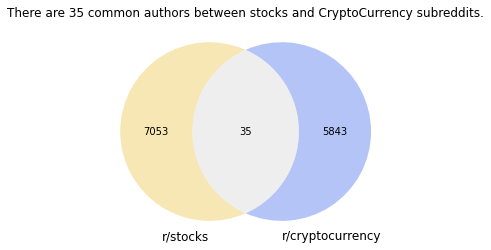

In [9]:
#author distribution, common authors may use the same expression in both subreddits
stocks_author = df[df['subreddit']=='stocks']['author']
crypto_author = df[df['subreddit']=='CryptoCurrency']['author']
common_author = set(stocks_author)&set(crypto_author)

venn2_unweighted(
    subsets=((len(stocks_author)-len(common_author),(len(crypto_author)-len(common_author)),len(common_author))),
    set_labels = ('r/stocks','r/cryptocurrency'),
    set_colors =('#ECC445','#456DEC'))
plt.title(f'There are {len(common_author)} common authors between stocks and CryptoCurrency subreddits.');
df.drop(columns='author',inplace=True)

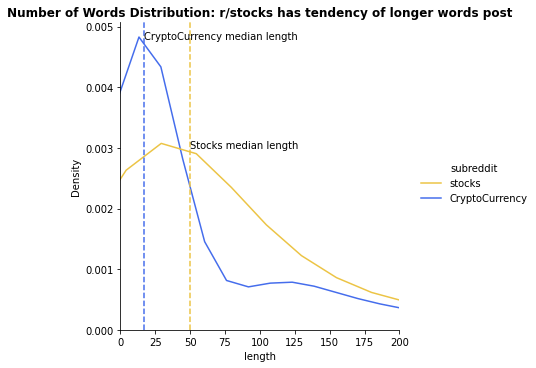

In [10]:
#post length distribution
sns.displot(data=df,x='length',hue='subreddit',kind='kde',palette=['#ECC445','#456DEC'])
plt.xlim(0,200)
plt.axvline(x=df.loc[df['subreddit']=='stocks']['length'].median(),color='#ECC445',linestyle='--')
plt.annotate(f'Stocks median length',xy=(50,0.003),fontsize=10)
plt.axvline(x=df.loc[df['subreddit']=='CryptoCurrency']['length'].median(),color='#456DEC',linestyle='--')
plt.annotate(f'CryptoCurrency median length',xy=(17,0.0048),fontsize=10)
plt.title('Number of Words Distribution: r/stocks has tendency of longer words post',fontweight = 'bold');


In [11]:
#
def plot_words(df,sub,vectorizer):
        df_draw = df.loc[df['subreddit']==sub]
        vectorizer_dict = {'CountVectorizer':CountVectorizer(),'TFIDF': TfidfVectorizer()}
        model = vectorizer_dict[vectorizer]
        model.fit(df_draw['post'])
        col_vec = model.transform(df_draw['post'])
        col_df = pd.DataFrame(col_vec.todense(),columns=model.get_feature_names_out())
        col_df.sum().sort_values(ascending=False).head(10).plot(kind='barh');
        plt.title(f'Top 15 Words in {sub}')
        return col_df

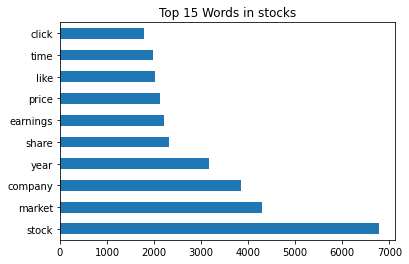

In [12]:
stock_cv = plot_words(df,'stocks','CountVectorizer')

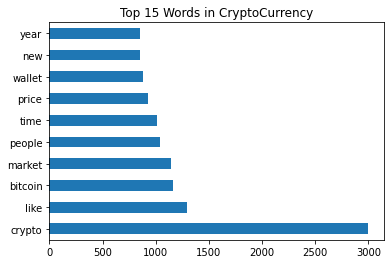

In [13]:
crypto_cv = plot_words(df,'CryptoCurrency','CountVectorizer')

There are overlapping words such as "like", "market", "time", and "year", but *the distinct difference is the word "stocks" and "crypto"*.

In [14]:
#therefore, removing those 2 words to see how our model perform
df['post'] = df['post'].apply(lambda x: re.sub("crypto","",x))
df['post'] = df['post'].apply(lambda x: re.sub("stock","",x))

## Vectorizer Principal Component Analysis

In [15]:
#function to plot PCA
def pca_plot(X,y,title):   
    pca = PCA(random_state=42,n_components=10)
    Z_train = pca.fit_transform(X) #already arranged based on order of importance
    pc1 = Z_train[:,0]
    pc2 = Z_train[:,1]

    plt.figure(figsize=(8,8))

    color = ['#ECC445' if y_item==0 else '#456DEC'for y_item in y]
    plt.scatter(pc1,pc2,c=color,edgecolors='#000000')
    plt.xticks(size=12)
    plt.yticks(size=12)
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title(title);

    var = pca.explained_variance_[0:10]
    labels =['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']
    plt.figure(figsize=(8,6))
    plt.bar(labels,var)
    plt.xlabel('Principle Component')
    plt.ylabel('Percentage of Variance Explained');
    

In [16]:
#define vectorizer
def vectorizer(df,vectorizer):
        vectorizer_dict = {'CountVectorizer':CountVectorizer(),'TFIDF': TfidfVectorizer()}
        model = vectorizer_dict[vectorizer]
        post_vec = model.fit_transform(df)
        col_df = pd.DataFrame(post_vec.todense(),columns=model.get_feature_names_out())
        return col_df

In [17]:
#define target feature
df['subreddit'] = df['subreddit'].map({'stocks':0,'CryptoCurrency':1})
X = df['post']
y = df['subreddit']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=42)

#### Count Vectorizer
Bag of Words is a vocabulary model from the corpus and counts how many times the words appear. Each word corresponds to one feature. However, frequency might not be the best predictor, therefore, there is term frequence-inverse document frequency (TFIDF).

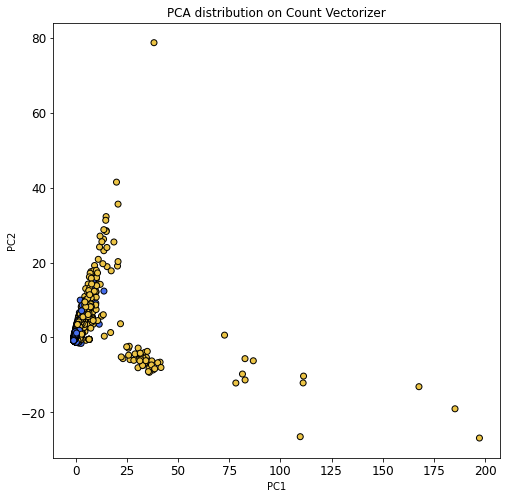

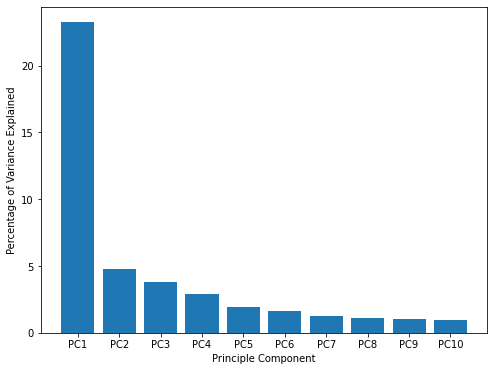

In [18]:
X_train_cv = vectorizer(X_train,'CountVectorizer')
pca_plot(X=X_train_cv,y=y_train,title='PCA distribution on Count Vectorizer')


#### Term Frequency - Inverse Document Frequency (TFIDF)

TFIDF method allows text to numeric data transofrmation like CountVectorizer but TFIDF provides the importance of the words in the corpus by calculating how many times a word appears in a document and inverse of word occurance accross the document.

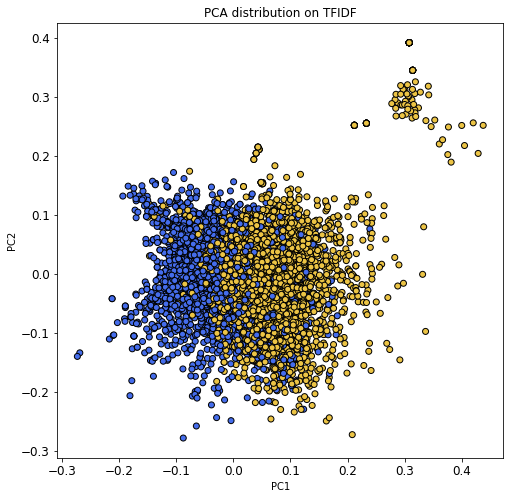

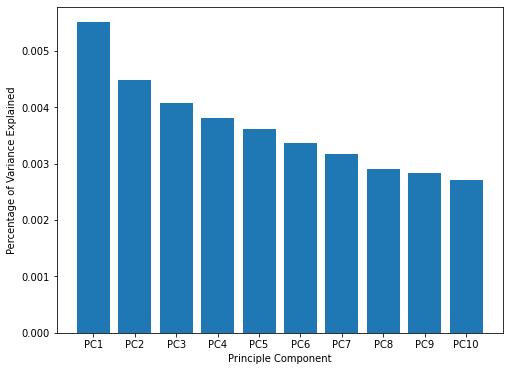

In [19]:
X_train_tv = vectorizer(X_train,'TFIDF')
pca_plot(X=X_train_tv,y=y_train,title='PCA distribution on TFIDF')

#### Google Word2Vec
Pre-trained embedded vectors on 100 billion words from Google news dataset, published in 2013, containing 300 dimensional vectors for over 3 million words and phrases. Word2Vec gives meaning stored in array of vectors. Example of Google Word2Vec:
> vector("king") - vector("man") + vector("woman") = vector("queen")

In [20]:
nlp = api.load("word2vec-google-news-300")

def vec_array(token,token_vec,a):
    words_vector = []
    for word in token:
        try:
            words_vector.append(token_vec[word])
        except:
            words_vector.append(np.zeros(a))
    return sum(words_vector)/len(token)

In [21]:
vectorized_token = df['token'].apply(lambda x: vec_array(token=x, token_vec=nlp,a=300))
df_w2v = pd.DataFrame(vectorized_token.tolist())
df_w2v.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.005404,0.021240,0.006827,0.057259,-0.034642,-0.016592,0.061051,-0.072012,0.086083,0.035747,...,-0.022549,0.047921,-0.078459,0.012986,-0.028091,-0.008915,-0.001621,-0.022531,0.024713,-0.027465
1,-0.100389,0.030905,0.007551,0.028846,-0.038062,-0.056076,0.063574,-0.039802,0.101261,0.033852,...,-0.083003,0.065573,-0.030431,0.022044,0.022488,0.038555,-0.027138,0.015667,0.003329,-0.019666
2,-0.019216,0.082818,-0.007077,0.086433,-0.034808,0.026295,0.019129,-0.086735,0.092226,0.056294,...,-0.060955,0.109434,-0.101477,0.015272,-0.039130,-0.048244,0.005425,-0.025462,-0.036770,0.026839
3,0.003738,-0.006607,-0.003975,0.025986,-0.007726,0.003611,0.030342,-0.060589,0.087971,0.041687,...,-0.074642,0.083357,-0.115456,0.028156,-0.058929,-0.018427,-0.017271,-0.058544,0.036308,-0.008465
4,0.018611,0.100865,-0.034033,0.123141,-0.053999,-0.030488,0.032544,-0.170941,0.077942,0.143223,...,-0.047741,0.002302,-0.105035,0.054835,0.039679,-0.025203,-0.039845,0.026031,0.054673,-0.009079


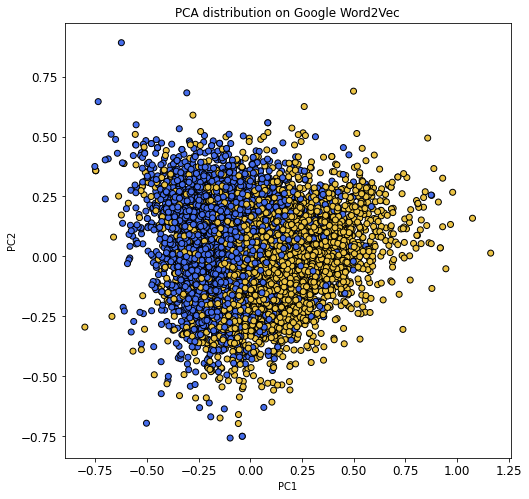

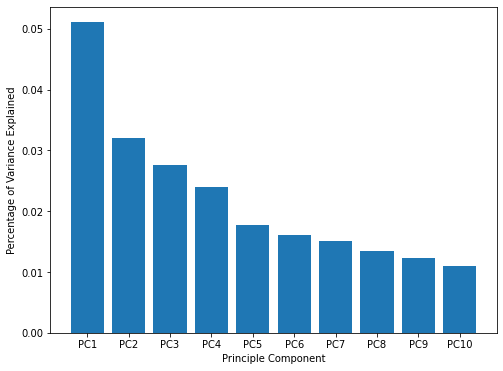

In [22]:
#to visualize on the stratified data
X_train_w2v, X_test_w2v, y_train_w2v, y_test_w2v = train_test_split(df_w2v,y,test_size=0.2,stratify=y,random_state=42)
pca_plot(X=X_train_w2v,y=y_train_w2v,title='PCA distribution on Google Word2Vec')

#### Stanford Twitter Global Vectors (GloVe)
Pre-trained embedded vectors on 2 billion twitter tweets, published in 2014 by Stanford University Computer Science Department, containint 200 dimensional vectors.

In [23]:
nlp_gl = api.load("glove-twitter-200")
vectorized_token = df['token'].apply(lambda x: vec_array(token=x, token_vec=nlp_gl,a=200))
df_gl = pd.DataFrame(vectorized_token.tolist())
df_gl.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,0.049478,0.136997,-0.072598,0.013720,-0.071078,0.070421,0.380682,-0.101639,0.071436,-0.056304,...,0.116480,-0.047370,0.086630,-0.019313,0.079678,-0.034363,0.137938,0.048611,0.025608,-0.035213
1,0.000517,-0.015142,0.008981,-0.023371,-0.103891,-0.013312,0.265533,-0.110026,0.021823,-0.289947,...,0.173792,-0.097847,0.126901,-0.045288,0.048963,0.008202,0.190227,0.090323,0.072054,0.042901
2,-0.025939,0.076264,-0.014166,0.079982,-0.140136,0.154380,0.301245,-0.036472,-0.114001,0.032132,...,-0.007098,0.001513,0.131808,-0.016832,-0.011183,0.048625,0.075009,0.070498,-0.001152,-0.039887
3,0.006339,0.176740,-0.179762,0.061989,-0.106132,0.107123,0.554809,-0.033163,0.161208,0.057941,...,0.047939,-0.167490,0.040844,-0.125785,-0.032028,-0.037579,0.129961,-0.004122,0.074264,-0.104128
4,0.018821,-0.039421,-0.049089,0.040300,-0.159493,-0.009800,0.472673,-0.202445,-0.038353,-0.199172,...,0.237768,-0.149361,0.089777,-0.048257,0.028385,0.015784,0.176795,0.067942,0.102476,0.148353


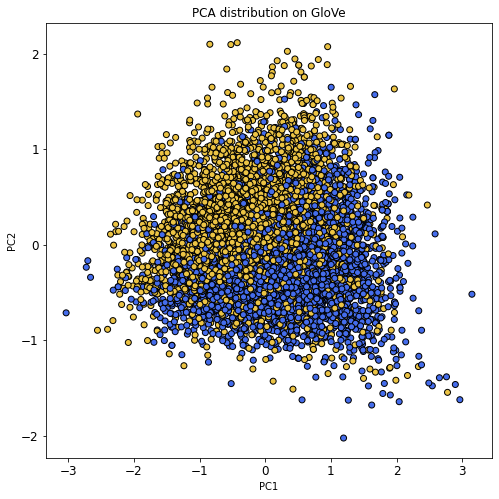

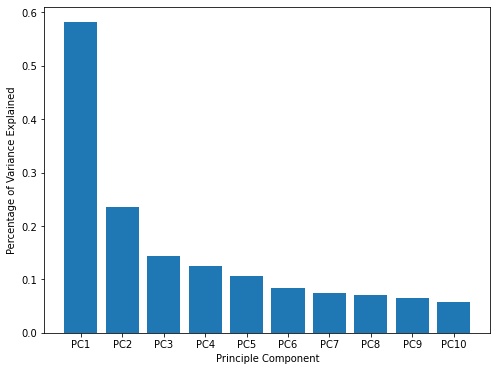

In [24]:
#to visualize on the stratified data
X_train_gl, X_test_gl, y_train_gl, y_test_gl = train_test_split(df_gl,y,test_size=0.2,stratify=y,random_state=42)
pca_plot(X=X_train_gl,y=y_train_gl,title='PCA distribution on GloVe')

### Principal Component Analysis Summary
Looking at the principal component analysis escpecially on the pretrained models we observed the more opposite class data in the respective region compared to Count Vectorizer and TFIDF. This can be an indicator for Count Vectorizer and TFIDF to perform better than the pre-trained model. 

The potential reason might be due to the nature of the subreddits whereby the conversation topic is very dynamically changing. The separation is not very clear, but we can see that there is *more number of the opposite class in the particular class region* in the pre-trained model

**Therefore, I am expecting the CountVectorizer and TFIDF to perform better than the pre-trained embedded vectors in the machine learning model**

## 7. Model and Evaluation

In [25]:
#choosing randomized search for faster evaluation
def gs_model(estimator,param,X,y):
    gs_model = RandomizedSearchCV(
    estimator = estimator,
    param_distributions = param,
    cv = 5,
    n_jobs = -1,
    return_train_score = True,
    verbose=1,
    scoring = 'roc_auc',
)
    gs_model.fit(X_train,y_train)
    return gs_model

#### Learning Curve 
Learning curve is used to check whether our model can further be optimized. When **there is a gap between the training set and the cross validation score with a non plateau curve at the end**, it means model **can further be improved** with having more training data.

In [26]:
#define function to plot learning Curve

def plotlearningcurve(estimator, title, X, y, ylim=None, cv=5, n_jobs=-1, train_sizes = np.linspace(.1, 1, 5), scoring=None):
    
    _, axes = plt.subplots(1, 1, figsize=(20, 5))
    axes.set_title(title)
    axes.set_xlabel('Training Examples')
    axes.set_ylabel('Scores')
    
    if ylim is not None:
        axes.set_ylim(*ylim)

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=5, n_jobs= n_jobs, scoring=scoring, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    axes.grid()
    
    axes.plot(train_sizes, train_scores_mean, 'o-', color='r', label="Training score")
    axes.plot(train_sizes, test_scores_mean, 'o-', color='g', label="CV score")
    
    axes.fill_between(train_sizes, 
                     train_scores_mean + train_scores_std, 
                     train_scores_mean - train_scores_std,
                    alpha = 0.1,
                    color='r')

    axes.fill_between(train_sizes, 
                 test_scores_mean + test_scores_std, 
                 test_scores_mean - test_scores_std,
                    alpha = 0.1,
                    color='g')
    

    axes.legend(loc='best')
    
    return plt

#### Metrics Evaluation:
1. Accuracy: ratio of right prediction to total number ofprediction
2. ROC: illustrate the True Positive Rate against the False Positive rates and the area under the curve (ROC-AUC) is the probability that the model will rank randomly chosen positive observation higher than randomly chosen negative.
3. Precision: quantifying the number of positive class prediction in the positive class.
4. Recall: quantifying the number of positive class out of all the positive samples
5. F-1 (F-beta): provides score that balance precision and recall. We will chose beta<1 if we value Precision and beta>2 if we value Recall more

In [27]:
#model scoring overview
def overfit_or_not(delta):
    if delta<=0.05:
        return "well-fitted"
    elif (delta<=15) or (delta>5):
        return "slight overfitting"
    else:
        return "severe overfitting"
def scoring_overview(model,title,gridsearch,X_train=X_train,X_test=X_test,y_train=y_train,y_test=y_test):
    fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(14,12))
    ax = ax.ravel()
    fig.suptitle(f'{title}',fontsize=30,fontproperties = {'weight':'bold'})

    train_score = model.score(X_train,y_train)
    test_score = model.score(X_test,y_test)
    y_pred = model.predict(X_test)
    roc = roc_auc_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    #training score and test score display
    ax[0].grid(False)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].annotate('Training Accuracy Score',xy=(0.1,0.8),fontsize=16,va='top',ha='left')
    ax[0].annotate(f'{round(train_score*100,2)}%',xy=(0.5,0.6),fontsize=20,va='top',ha='center',fontweight='bold')
    ax[0].annotate('Testing Accuracy Score',xy=(0.1,0.4),fontsize=16,va='top',ha='left')
    ax[0].annotate(f'{round(test_score*100,2)}%',xy=(0.5,0.2),fontsize=20,va='top',ha='center',fontweight='bold')

    #for all precision, recall, and auc score
    ax[1].grid(False)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].annotate(f'ROC Score: {round(roc*100,2)}%',xy=(0.1,0.7),fontsize=16)
    ax[1].annotate(f'Recall Score: {round(recall*100,2)}%',xy=(0.1,0.5),fontsize=16)
    ax[1].annotate(f'Precision Score: {round(precision*100,2)}%',xy=(0.1,0.3),fontsize=16)
    ax[1].annotate(f'F1 Score: {round(f1*100,2)}%',xy=(0.1,0.1),fontsize=16)

    #plotting confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    plot_confusion_matrix(model, X_test, y_test, display_labels = ['Stocks','CryptoCurrency'], cmap='Blues', values_format='d',ax=ax[5])
    miss = fp+fn

    #plotting Metrics used 
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    if gridsearch == 'Yes':
        ax[4].grid(False)
        delta_y = 0.9/(len(model.best_params_)+1)
        y = 0.9
        ax[4].annotate('Hyperparameter Tuning',xy=(0.3,1),fontsize=14,fontweight='bold')
        for metric,val in model.best_params_.items():
            y-=delta_y
            a  = re.findall('_([^_]*_[^_]*$)',metric)[0]
            b = re.search('[^_]+',metric)[0]
            ax[4].annotate(
                text= f'{a} metrics for {b} : {val}',
                xy = (0.1,y),
                fontsize = 16,
            )
    #precision-recall curve:
    y_test_array = pd.get_dummies(y_test, drop_first=False).values
    classes= np.unique(y_test)
    predicted_prob = model.predict_proba(X_test)
    for i in range(len(classes)):
        precision, recall, thresholds = precision_recall_curve(
                    y_test_array[:,i], predicted_prob[:,i])
        ax[3].plot(recall, precision, lw=3, 
               label='{0} (area={1:0.2f})'.format(classes[i], 
                                  auc(recall, precision))
              )
    ax[3].set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', 
            ylabel="Precision", title="Precision-Recall curve")
    ax[3].legend(loc="best")
    ax[3].grid(True)

    ## Plot roc
    for i in range(len(classes)):
        fpr, tpr, thresholds = roc_curve(y_test_array[:,i],  
                            predicted_prob[:,i])
        ax[2].plot(fpr, tpr, lw=3, 
                label='{0} (area={1:0.2f})'.format(classes[i], 
                                auc(fpr, tpr))
                )
    ax[2].plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
    ax[2].set(xlim=[-0.05,1.0], ylim=[0.0,1.05], 
            xlabel='False Positive Rate', 
            ylabel="True Positive Rate (Recall)", 
            title="Receiver Operating Characteristic (ROC)")
    ax[2].legend(loc="lower right")
    ax[2].grid(True)

    for s in ['top','right','bottom','left']:
        ax[0].spines[s].set_visible(False)
        ax[1].spines[s].set_visible(False)
        ax[4].spines[s].set_visible(False)

#### Logistic Regression - CountVectorizer

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


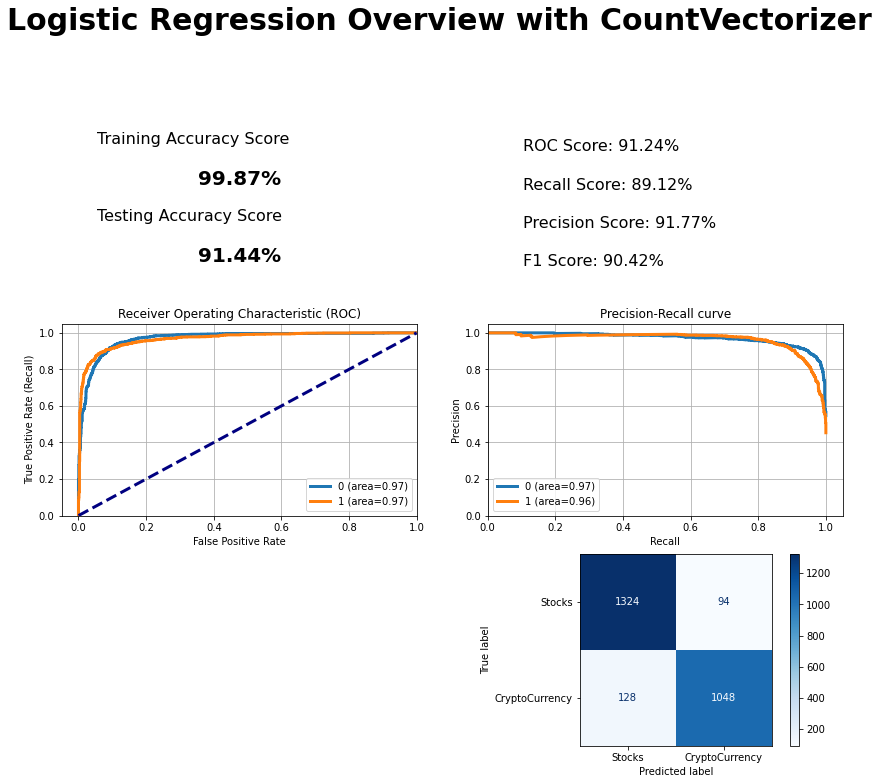

In [28]:
pipe1_cv = Pipeline([
    ('cvec',CountVectorizer(stop_words='english',ngram_range=(1,2))),
    ('lr_cv',LogisticRegression(max_iter=100000,random_state=42))
])

pipe1_cv.fit(X_train,y_train);
scoring_overview(model=pipe1_cv,title='Logistic Regression Overview with CountVectorizer', gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

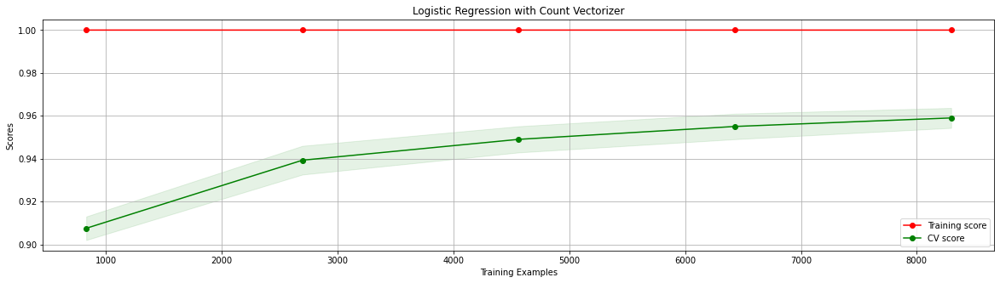

In [29]:
plotlearningcurve(pipe1_cv,'Logistic Regression with Count Vectorizer', X_train, y_train, scoring='roc_auc')

#### Logistic Regression - TFIDF

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


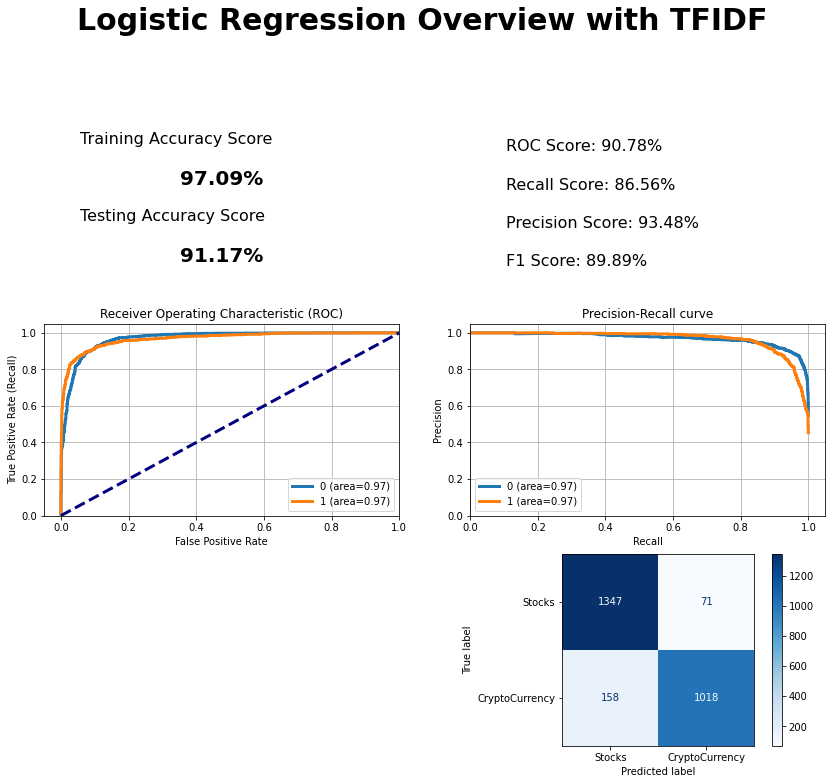

In [30]:
#changing the baseline vectorizer to tfid has increased the performance
pipe1_tv = Pipeline([
    ('tfid',TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('lr_tv',LogisticRegression(max_iter=100000,random_state=42))
])

pipe1_tv.fit(X_train,y_train);

scoring_overview(model=pipe1_tv, title='Logistic Regression Overview with TFIDF', gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

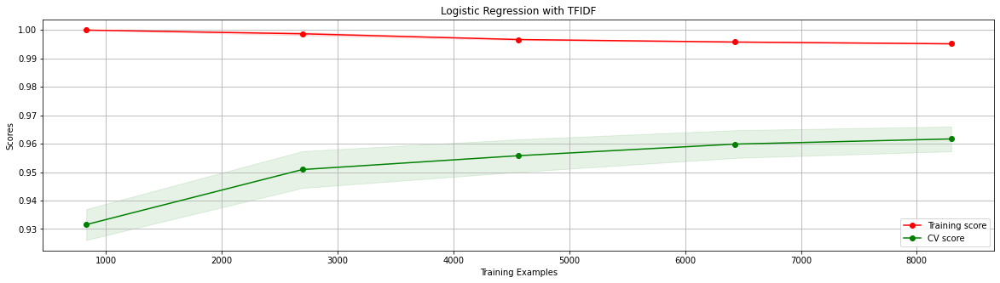

In [31]:
plotlearningcurve(pipe1_tv,'Logistic Regression with TFIDF', X_train, y_train, scoring='roc_auc')

#### Logistic Regression - Word2Vec

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


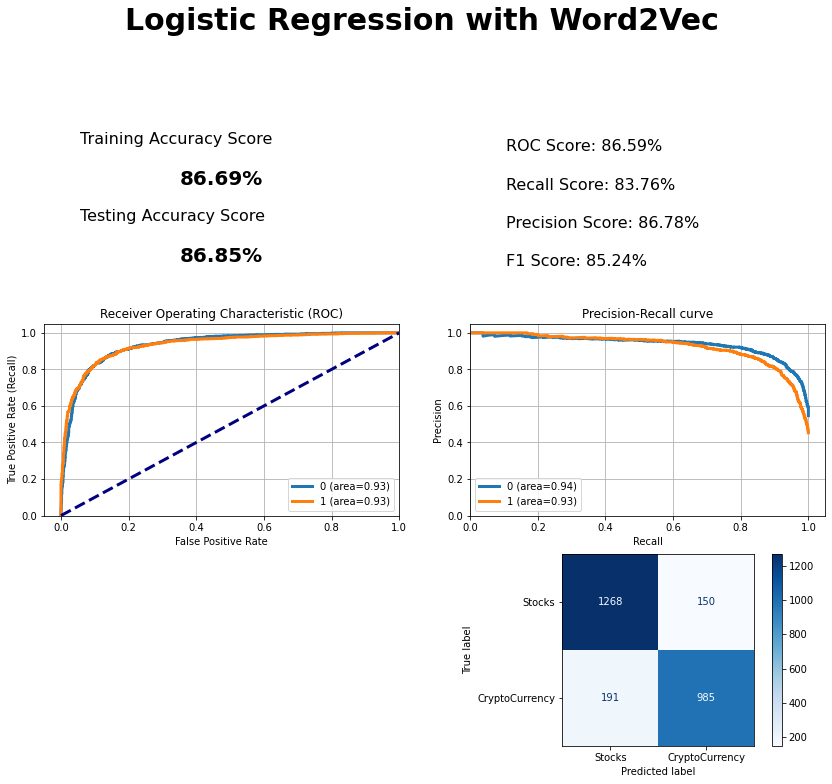

In [32]:
pipe1_w2v = Pipeline([
    ('lr_vec', LogisticRegression())
    ])
pipe1_w2v.fit(X_train_w2v,y_train_w2v)
scoring_overview(pipe1_w2v,title ='Logistic Regression with Word2Vec',X_train=X_train_w2v,X_test=X_test_w2v,y_train=y_train_w2v,y_test=y_test_w2v,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

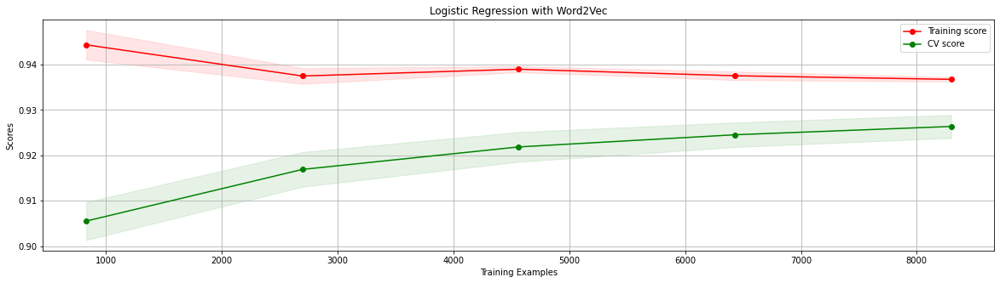

In [33]:
plotlearningcurve(pipe1_w2v,'Logistic Regression with Word2Vec', X_train_w2v, y_train_w2v, scoring='roc_auc')

#### Logistic Regression - GloVe

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


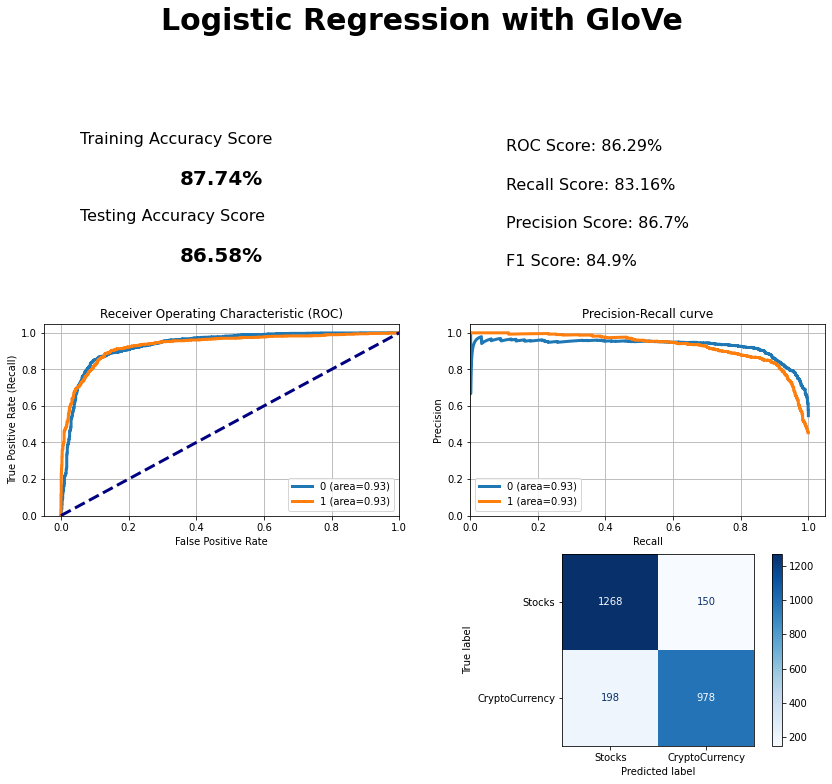

In [34]:
pipe1_gl = Pipeline([('lr_vec', LogisticRegression())])
pipe1_gl.fit(X_train_gl,y_train_gl)
scoring_overview(pipe1_gl,title ='Logistic Regression with GloVe',X_train=X_train_gl,X_test=X_test_gl,y_train=y_train_gl,y_test=y_test_gl,gridsearch='No')

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

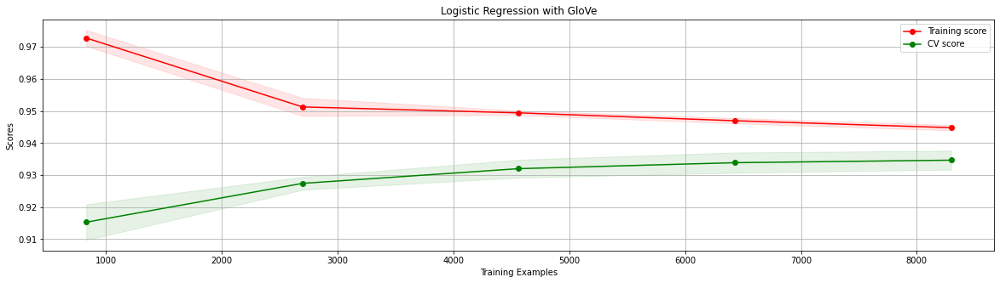

In [35]:
plotlearningcurve(pipe1_gl,'Logistic Regression with GloVe', X_train_gl, y_train_gl, scoring='roc_auc')

#### Multinomial Naive Bayes - CountVectorizer

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


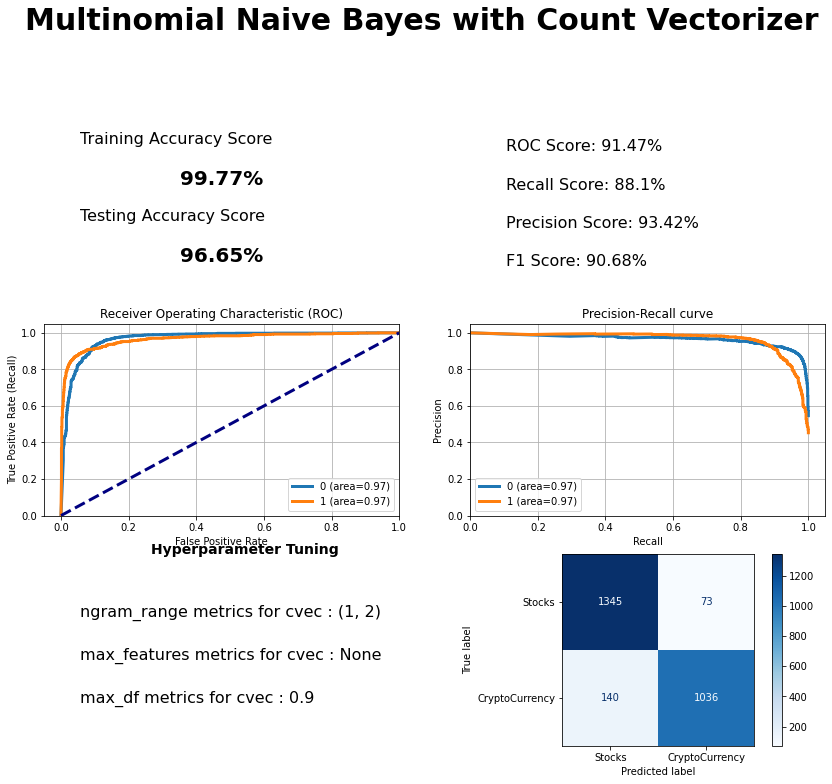

In [36]:
pipe2_cv = Pipeline([
    ('cvec', CountVectorizer()),
    ('nb', MultinomialNB())
])
pipe_cv_params = {
    'cvec__max_features': [5_000,7_000,None],
    'cvec__max_df': [.85,.9],
    'cvec__ngram_range': [(1,1), (1,2)],
}
gs_nb_cv = gs_model(pipe2_cv,pipe_cv_params,X_train,y_train)
scoring_overview(model = gs_nb_cv, title = 'Multinomial Naive Bayes with Count Vectorizer',gridsearch='Yes')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

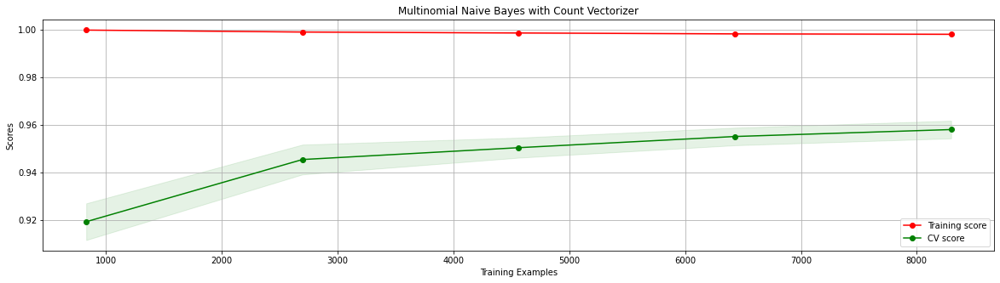

In [39]:
pipe2_cv = Pipeline([
    ('cvec', CountVectorizer(max_df=0.9,ngram_range=(1,2))),
    ('nb', MultinomialNB())
])
pipe2_cv.fit(X_train,y_train);
plotlearningcurve(pipe2_cv,'Multinomial Naive Bayes with Count Vectorizer', X_train, y_train, scoring='roc_auc')

#### Multinomial Naive Bayes - TFIDF

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


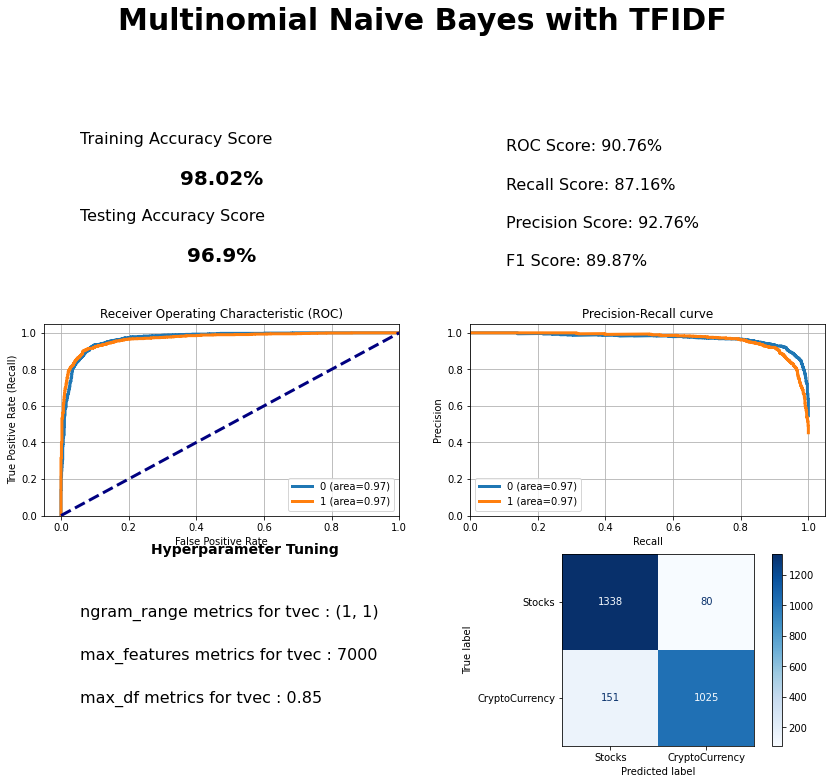

In [40]:
pipe2_tv = Pipeline([
    ('tvec', TfidfVectorizer()),
    ('nb', MultinomialNB())
])
pipe_tvec_params = {
    'tvec__max_features': [5_000,7_000,None],
    'tvec__max_df': [.85,.9],
    'tvec__ngram_range': [(1,1), (1,2)],
}
gs_nb_tv = gs_model(pipe2_tv,pipe_tvec_params,X_train,y_train)
scoring_overview(model = gs_nb_tv, title = 'Multinomial Naive Bayes with TFIDF',gridsearch='Yes')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

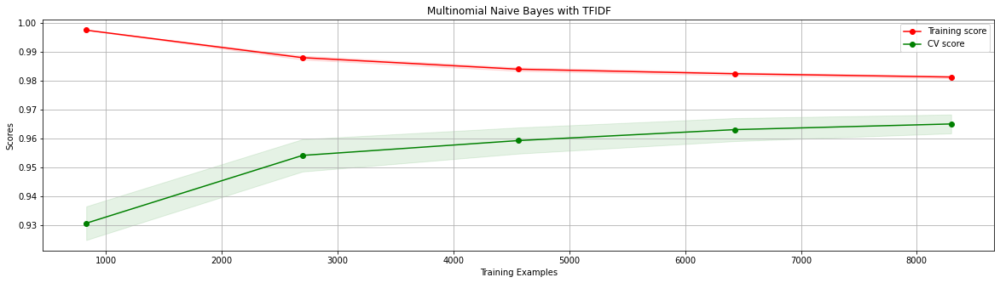

In [41]:
pipe2_tv = Pipeline([
    ('tvec', TfidfVectorizer(max_features=7000,ngram_range=(1,1),max_df=.85)),
    ('nb', MultinomialNB())
])
pipe2_tv.fit(X_train,y_train);
plotlearningcurve(pipe2_tv,'Multinomial Naive Bayes with TFIDF', X_train, y_train, scoring='roc_auc')

#### Multinomial Naive Bayes - W2V

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


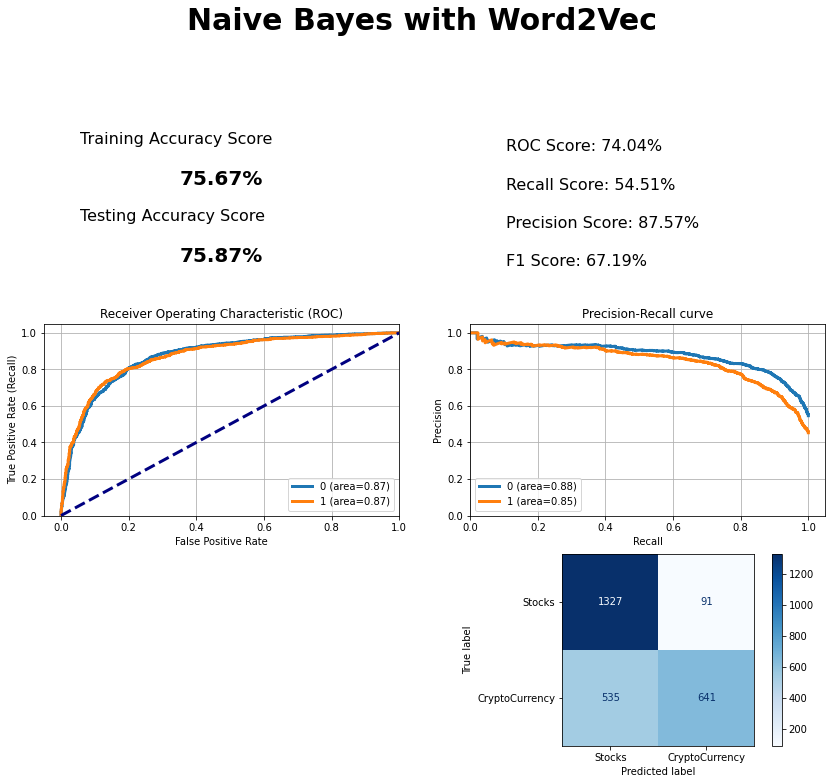

In [42]:
pipe2_w2v = Pipeline([
    ('mm',MinMaxScaler([0,1])),#since naive bayes dont allow negative value
    ('nb_w2v',MultinomialNB())
    ])
pipe2_w2v.fit(X_train_w2v,y_train_w2v);
scoring_overview(pipe2_w2v,title ='Naive Bayes with Word2Vec',X_train=X_train_w2v,X_test=X_test_w2v,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

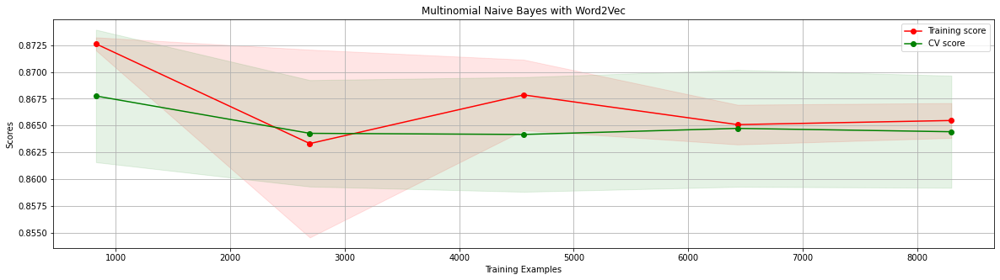

In [43]:
plotlearningcurve(pipe2_w2v,'Multinomial Naive Bayes with Word2Vec', X_train_w2v, y_train_w2v, scoring='roc_auc')

#### Multinomial Naive Bayes - GloVe

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


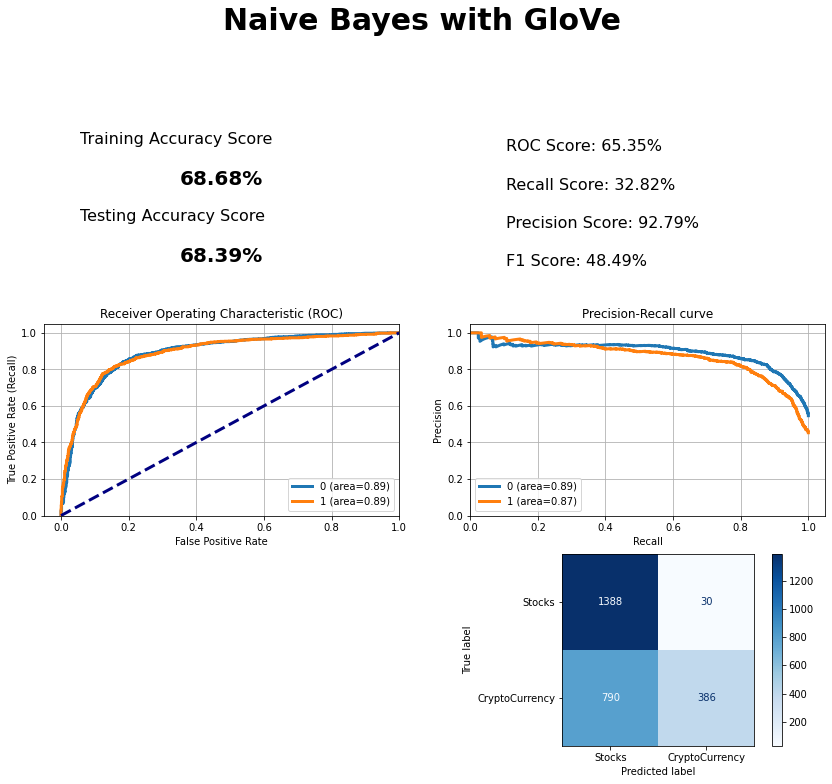

In [44]:
pipe2_gl = Pipeline([
    ('mm',MinMaxScaler([0,1])),#since naive bayes dont allow negative value
    ('nb_gl',MultinomialNB())
    ])
pipe2_gl.fit(X_train_gl,y_train_gl);
scoring_overview(pipe2_gl,title ='Naive Bayes with GloVe',X_train=X_train_gl,X_test=X_test_gl,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

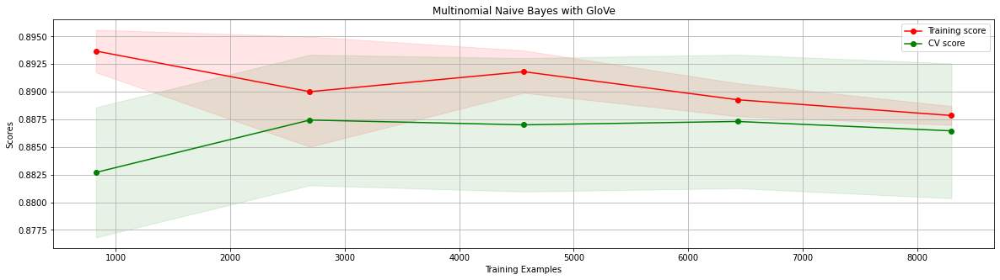

In [45]:
plotlearningcurve(pipe2_gl,'Multinomial Naive Bayes with GloVe', X_train_gl, y_train_gl, scoring='roc_auc')

#### Random Forest - CountVectorizer

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


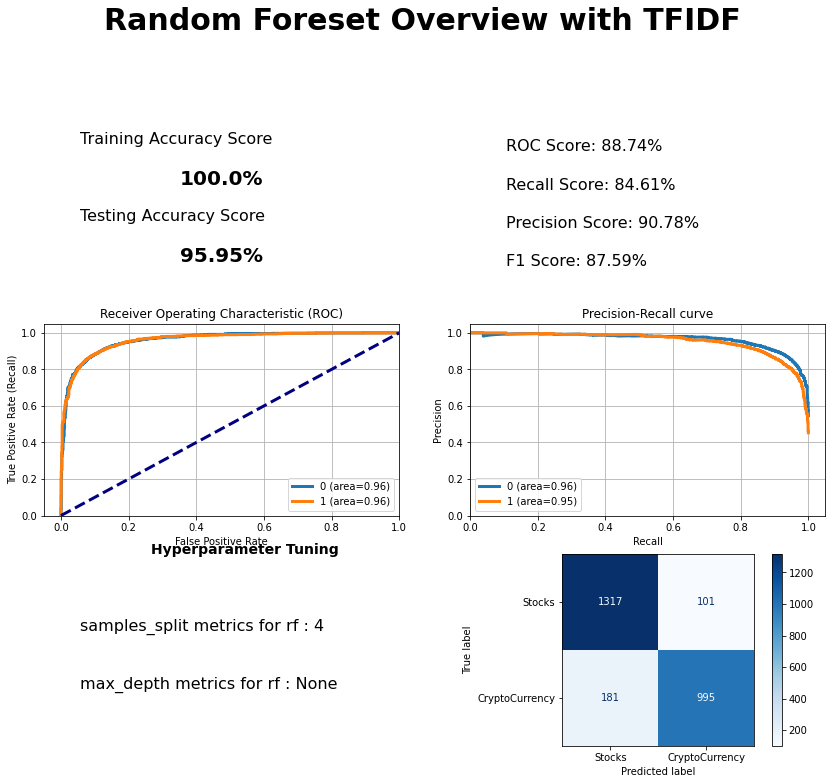

In [46]:
pipe3_cv = Pipeline([
    ('cvec', CountVectorizer(stop_words='english',ngram_range=(1,2))),
    ('rf', RandomForestClassifier(random_state=42))
])
pipe_cv_params = {
    'rf__max_depth' : [50,75,100,None],
    'rf__min_samples_split' : [2,4,6],
}
gs_rf_cv =gs_model(pipe3_cv,pipe_cv_params,X_train,y_train)
scoring_overview(model=gs_rf_cv, title='Random Forest Overview with TFIDF', gridsearch='Yes')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

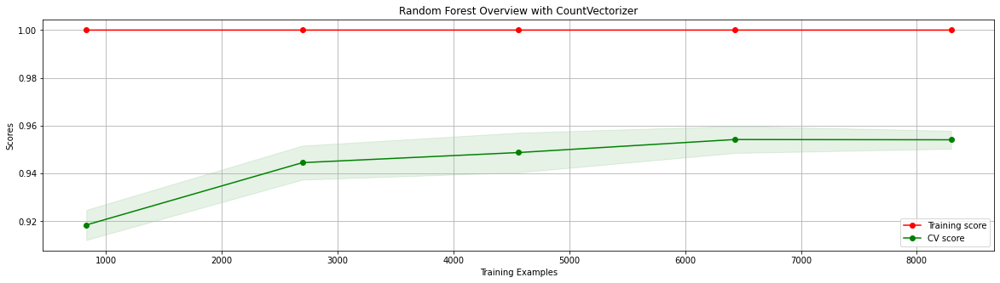

In [48]:
pipe3_cv = Pipeline([
    ('cvec', CountVectorizer(stop_words='english',ngram_range=(1,2))),
    ('rf', RandomForestClassifier(random_state=42,min_samples_split=4))
])
plotlearningcurve(pipe3_cv,'Random Forest Overview with CountVectorizer', X_train, y_train, scoring='roc_auc',n_jobs=-1)

#### Random Forest - TFIDF

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


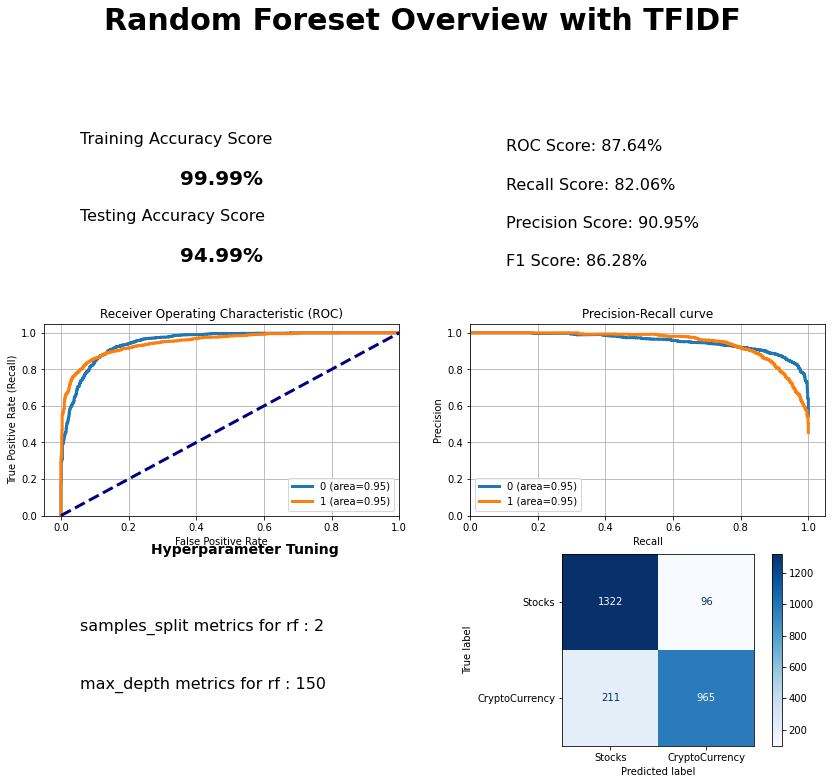

In [49]:
pipe3_tv = Pipeline([
    ('tvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('rf', RandomForestClassifier(random_state=42))
])
pipe_tv_params = {
    'rf__max_depth' : [50,75,100,150],
    'rf__min_samples_split' : [2,4,6],
}
gs_rf_tv =gs_model(pipe3_tv,pipe_tv_params,X_train,y_train)
scoring_overview(model=gs_rf_tv, title='Random Foreset Overview with TFIDF', gridsearch='Yes')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

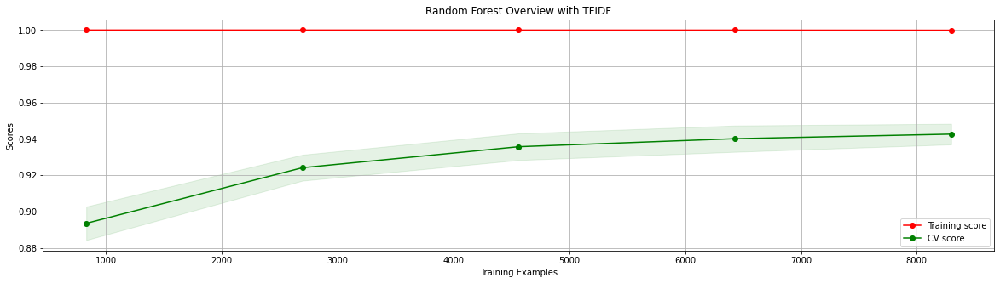

In [50]:
pipe3_tv = Pipeline([
    ('tvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('rf', RandomForestClassifier(random_state=42,max_depth=150,min_samples_split=2))
])

plotlearningcurve(pipe3_tv,'Random Forest Overview with TFIDF', X_train, y_train, scoring='roc_auc')

#### Random Forest - Word2Vec

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


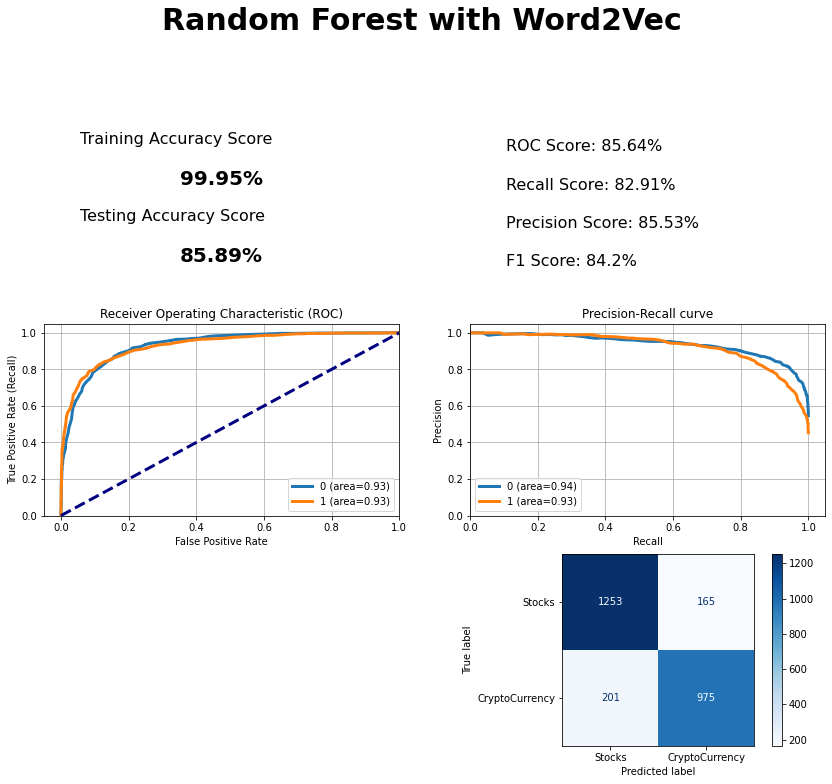

In [51]:
pipe3_w2v = Pipeline([
    ('rf', RandomForestClassifier(random_state=42))
    ])
pipe3_w2v.fit(X_train_w2v,y_train_w2v)
scoring_overview(pipe3_w2v,title ='Random Forest with Word2Vec',X_train=X_train_w2v,X_test=X_test_w2v,y_train=y_train_w2v,y_test=y_test_w2v,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

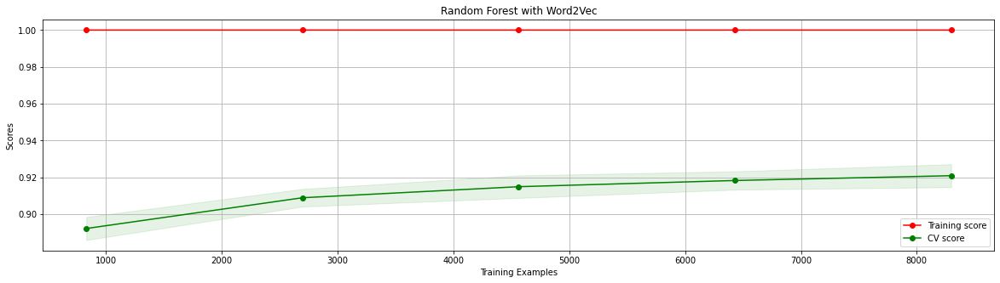

In [52]:
plotlearningcurve(pipe3_w2v,'Random Forest with Word2Vec', X_train_w2v, y_train_w2v, scoring='roc_auc')

#### Random Forest - GloVe

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


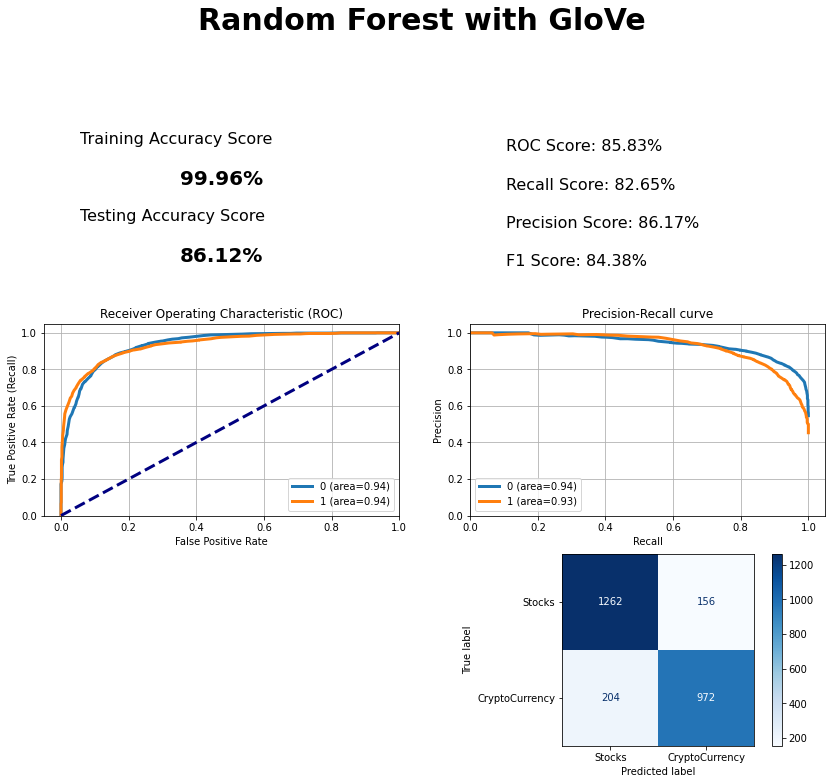

In [53]:
pipe3_gl = Pipeline([
    ('rf', RandomForestClassifier(random_state=42))
    ])
pipe3_gl.fit(X_train_gl,y_train_gl)
scoring_overview(pipe3_gl,title ='Random Forest with GloVe',X_train=X_train_gl,X_test=X_test_gl,y_train=y_train_gl,y_test=y_test_gl,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

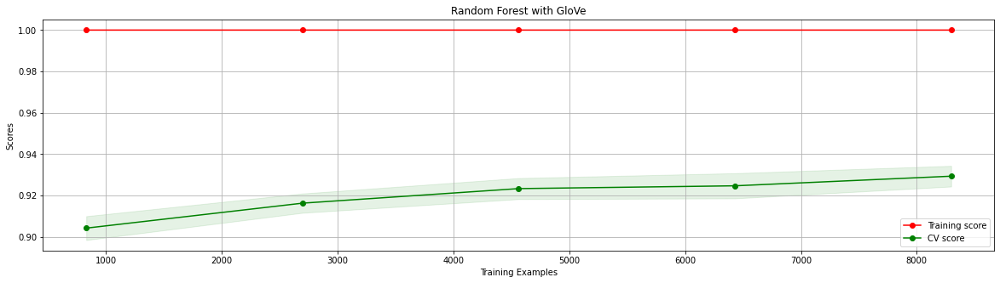

In [54]:
plotlearningcurve(pipe3_gl,'Random Forest with GloVe', X_train_gl, y_train_gl, scoring='roc_auc')

#### K Nearest Neighbors - CountVectorizer

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


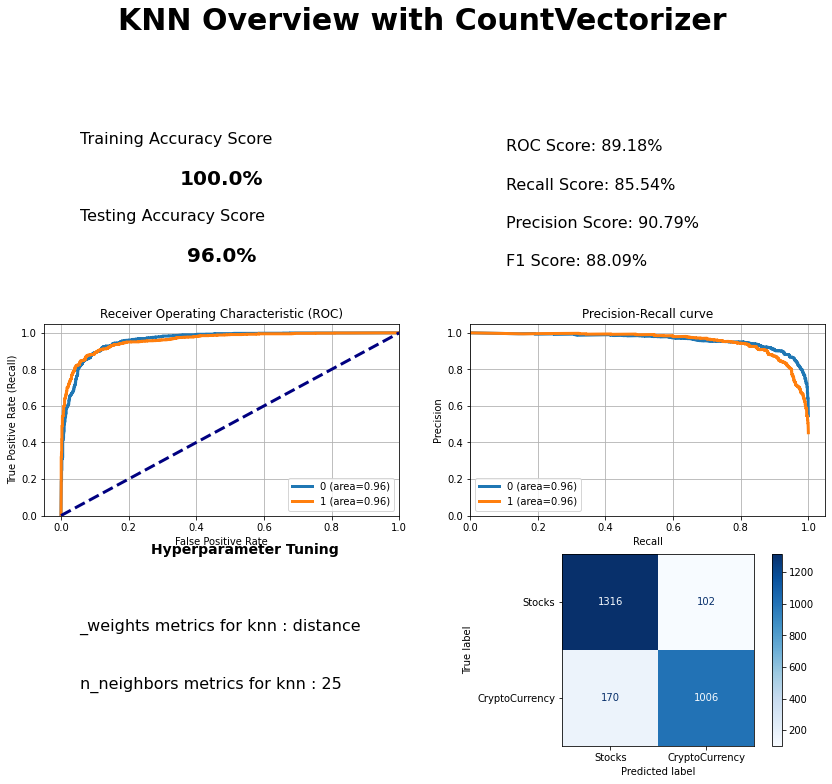

In [55]:
pipe4_cv = Pipeline([
    ('cvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('knn', KNeighborsClassifier()),
])
pipe_knn_param = {
    'knn__n_neighbors' : [5,25,50,125,150],
    'knn__weights':['uniform','distance']
}
gs_knn_cv =gs_model(pipe4_cv,pipe_knn_param,X_train,y_train)
scoring_overview(model=gs_knn_cv, title='KNN Overview with CountVectorizer', gridsearch='Yes')


<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

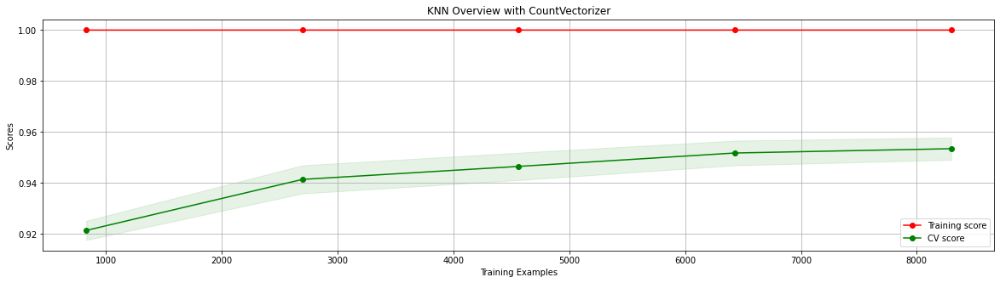

In [56]:
pipe4_cv = Pipeline([
    ('cvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('knn', KNeighborsClassifier(n_neighbors=25, weights='distance')),])
plotlearningcurve(pipe4_cv,'KNN Overview with CountVectorizer', X_train, y_train, scoring='roc_auc')

#### K Nearest Neighbors - TFIDF

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


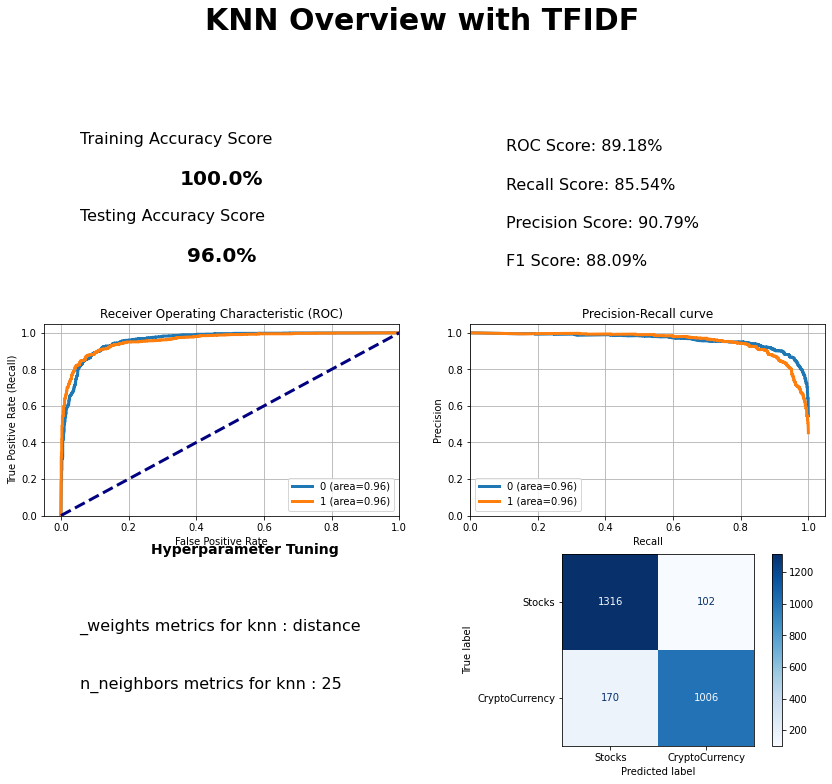

In [57]:
pipe4_tv = Pipeline([
    ('tvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('knn', KNeighborsClassifier()),
])
pipe_knn_param = {
    'knn__n_neighbors' : [5,25,50,125,150],
    'knn__weights':['uniform','distance']
}
gs_knn_tv =gs_model(pipe4_tv,pipe_knn_param,X_train,y_train)
scoring_overview(model=gs_knn_tv, title='KNN Overview with TFIDF', gridsearch='Yes')


<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

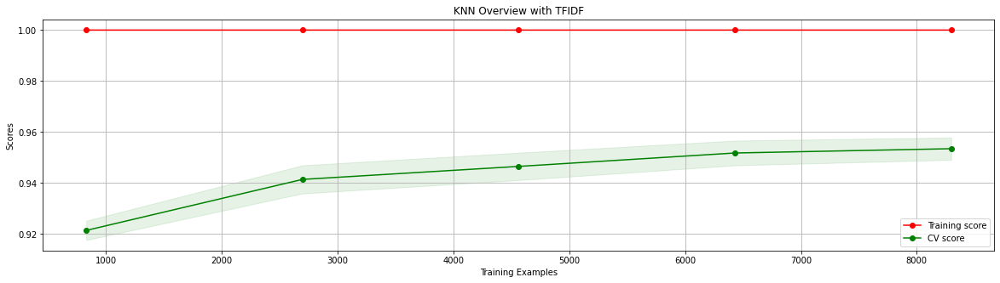

In [59]:
pipe4_tv = Pipeline([
    ('tvec', TfidfVectorizer(stop_words='english',ngram_range=(1,2))),
    ('knn', KNeighborsClassifier(n_neighbors=25,weights='distance')),
])
plotlearningcurve(pipe4_tv,'KNN Overview with TFIDF', X_train, y_train, scoring='roc_auc')

#### K Nearest Neighbors - Word2Vec

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


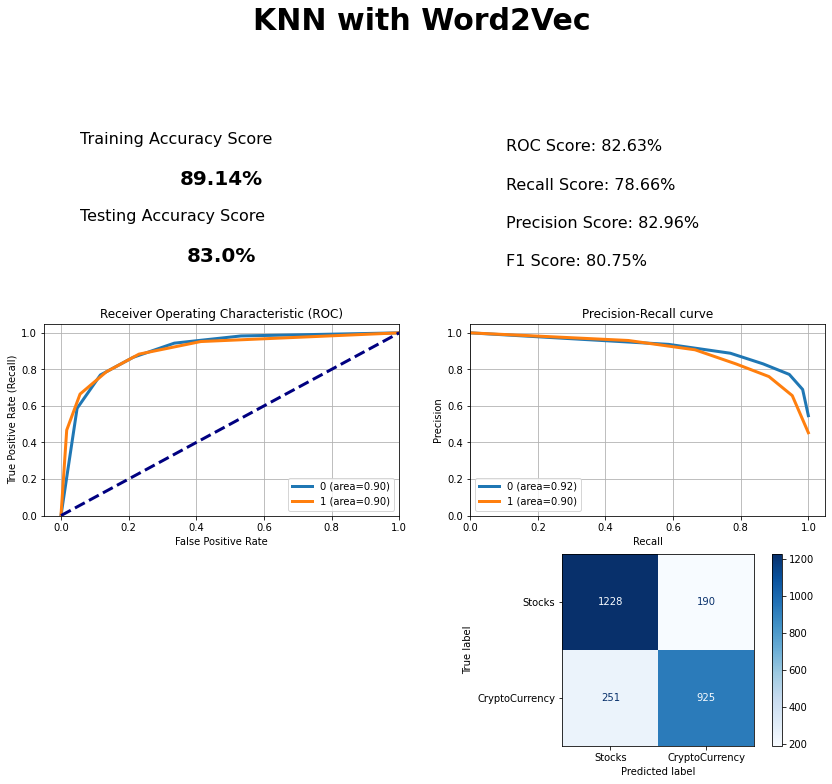

In [60]:
pipe4_w2v = Pipeline([
    ('knn', KNeighborsClassifier()),
])

pipe4_w2v.fit(X_train_w2v,y_train_w2v)
scoring_overview(pipe4_w2v,title ='KNN with Word2Vec',X_train=X_train_w2v,X_test=X_test_w2v,y_train=y_train_w2v,y_test=y_test_w2v,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

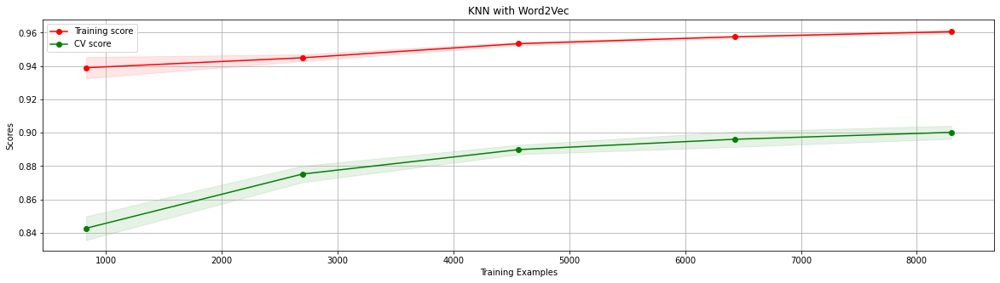

In [61]:
plotlearningcurve(pipe4_w2v,'KNN with Word2Vec', X_train_w2v, y_train_w2v, scoring='roc_auc')

#### Support Vector Classification - GloVe

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


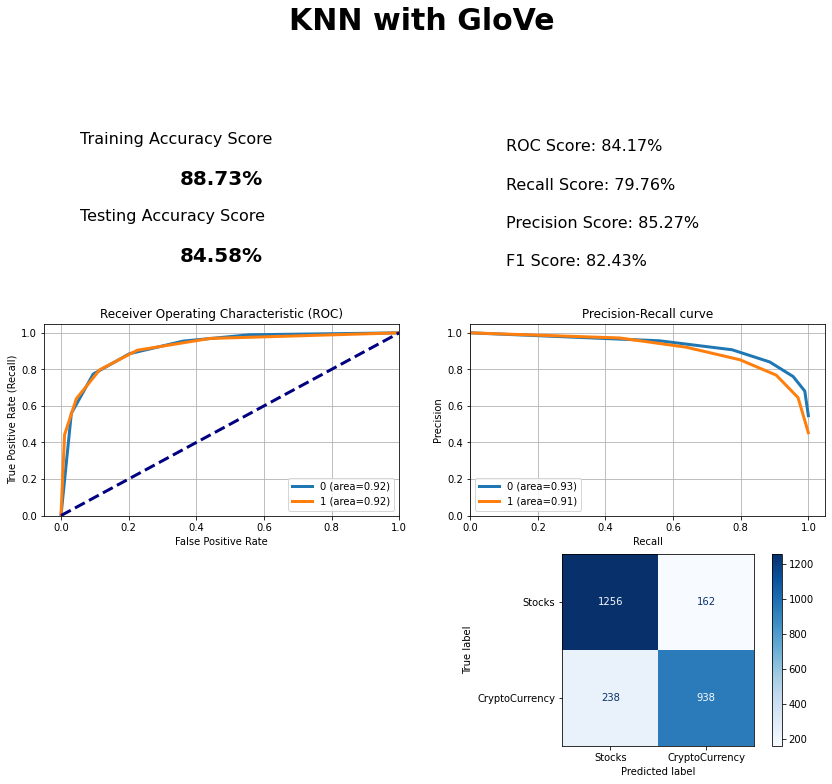

In [62]:
pipe4_gl = Pipeline([
    ('knn', KNeighborsClassifier()),
])
pipe4_gl.fit(X_train_gl,y_train_gl)
scoring_overview(pipe4_gl,title ='KNN with GloVe',X_train=X_train_gl,X_test=X_test_gl,y_train=y_train_gl,y_test=y_test_gl,gridsearch='No')

<module 'matplotlib.pyplot' from '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/pyplot.py'>

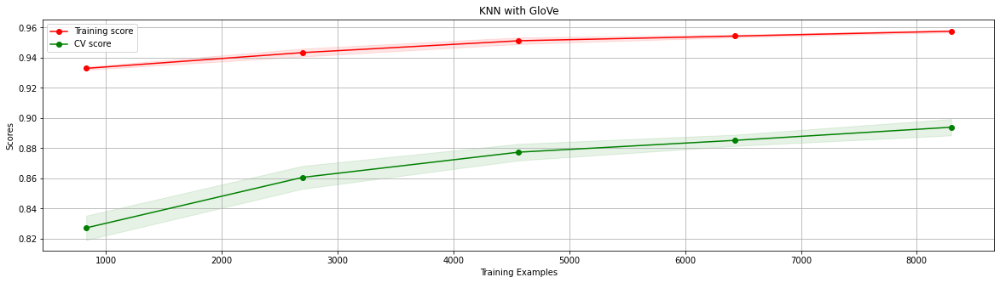

In [63]:
plotlearningcurve(pipe4_gl,'KNN with GloVe', X_train_gl, y_train_gl, scoring='roc_auc')

### Models Scoring Summary
|ROC AUC Score|CountVectorizer|TFIDF|Word2Vec|GloVe
|---|---|---|---|---|
|Logistic Regression|91.24|90.78|86.59|86.29|
|KNN|89.19|89.18|82.63|84.17|
|Naive Bayes|**91.47**|90.76|74.04|65.35|
|Random Forest|88.96|87.64|85.64|85.83|
 

Multinomial Naive Bayes algorithm is a probabilistic learning method where it predicts the class by calculating the probability of each class and gives the class with higher probability as final class. **The assumption of this model is that the features are independent to one another.** The accuracy score for the Training Set is 99.77% and 96.65% for test set which is a well generalizing model.

The performance is almost comparable with the Logistifc Regression model, but as we are looking for the model which can separate the class better, therefore, **Multinomial Naive Bayes with Count Vectorizer with features of less than 90% occurance is used and ngram range of (1,2)**. This will be a candidate for our final model. In the next section, we will optimize the threshold to get the best ROC score.

## 8. Threshold Selection and Final Model

#### Selection of Optimal Threshold
[reference](https://towardsdatascience.com/optimal-threshold-for-imbalanced-classification-5884e870c293)

In [64]:
# Array for finding the optimal threshold
thresholds = np.arange(0.0, 1.0, 0.0001)
rocauc = np.zeros(shape=(len(thresholds)))
y_pred_pr = pipe2_cv.predict_proba(X_test)
y_pred_pr = y_pred_pr[:, 1]
print('Length of sequence: {}'.format(len(thresholds)))

# Fit the model
for index, elem in enumerate(thresholds):
    # Corrected probabilities
    y_pred_prob = (y_pred_pr > elem).astype('int')
    # Calculate the f-score
    rocauc[index] = roc_auc_score(y_test, y_pred_prob)

# Find the optimal threshold
index = np.argmax(rocauc)
thresholdOpt = round(thresholds[index], ndigits = 4)
rocaucOpt = round(rocauc[index], ndigits = 4)
print('Best Threshold: {} with ROC-AUC score: {}'.format(thresholdOpt, rocaucOpt))

# Plot the threshold tuning
df_threshold_tuning = pd.DataFrame({'ROC-AUC':rocauc,
                                    'Threshold':thresholds})

Length of sequence: 10000
Best Threshold: 0.4088 with ROC-AUC score: 0.916


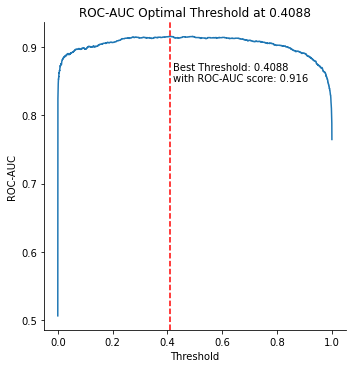

In [65]:
sns.relplot(
    data=df_threshold_tuning, 
    x="Threshold", y="ROC-AUC", 
    kind="line"
)
plt.axvline(x=thresholdOpt,linestyle='--',color='r')
plt.annotate("""Best Threshold: 0.4088 
with ROC-AUC score: 0.916""",xy=(0.42,0.85))
plt.title('ROC-AUC Optimal Threshold at 0.4088');

#### Final Model

In [66]:
threshold = 0.4088
#converted y probability to 0 and 1
y_pred_tuned = pd.Series(y_pred_pr)
y_pred_tuned = y_pred_tuned.apply(lambda x: 1 if x>=threshold else 0)

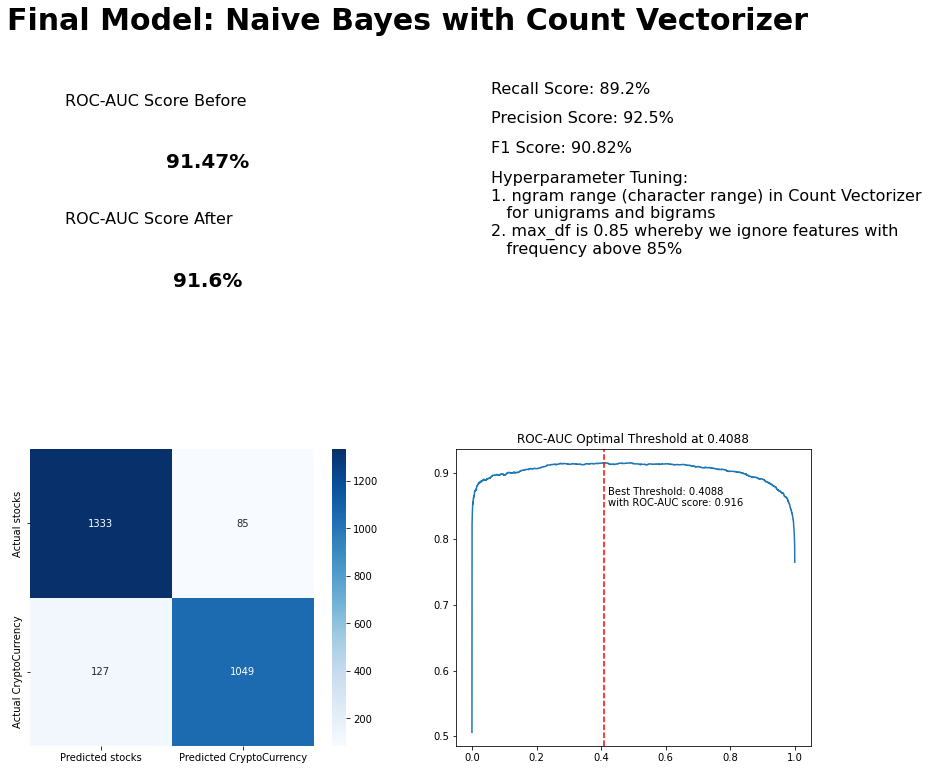

In [67]:
fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(14,12))
ax = ax.ravel()
fig.suptitle(f'Final Model: Naive Bayes with Count Vectorizer',fontsize=30,fontproperties = {'weight':'bold'})
roc_before = roc_auc_score(y_test, pipe2_cv.predict(X_test))
roc_after = roc_auc_score(y_test, y_pred_tuned)
recall = recall_score(y_test, y_pred_tuned)
precision = precision_score(y_test, y_pred_tuned)
f1 = f1_score(y_test, y_pred_tuned)

ax[0].grid(False)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].annotate('ROC-AUC Score Before',xy=(0.1,1),fontsize=16,va='top',ha='left')
ax[0].annotate(f'{round(roc_before*100,2)}%',xy=(0.5,0.8),fontsize=20,va='top',ha='center',fontweight='bold')
ax[0].annotate('ROC-AUC Score After',xy=(0.1,0.6),fontsize=16,va='top',ha='left')
ax[0].annotate(f'{round(roc_after*100,2)}%',xy=(0.5,0.4),fontsize=20,va='top',ha='center',fontweight='bold')

#for all precision, recall, and auc score
ax[1].grid(False)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].annotate(f'Recall Score: {round(recall*100,2)}%',xy=(0.1,1),fontsize=16)
ax[1].annotate(f'Precision Score: {round(precision*100,2)}%',xy=(0.1,0.9),fontsize=16)
ax[1].annotate(f'F1 Score: {round(f1*100,2)}%',xy=(0.1,0.8),fontsize=16)
ax[1].annotate(f"""
Hyperparameter Tuning:
1. ngram range (character range) in Count Vectorizer 
   for unigrams and bigrams
2. max_df is 0.85 whereby we ignore features with 
   frequency above 85%
""",xy=(0.1,0.4),fontsize=16)

#plotting confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_tuned).ravel()
sns.heatmap(confusion_matrix(y_test, y_pred_tuned), yticklabels=['Actual stocks', 'Actual CryptoCurrency'], xticklabels=['Predicted stocks', 'Predicted CryptoCurrency'],
            cmap = 'Blues',annot=True,fmt='d',ax=ax[2])

#roc score
ax[3].plot(df_threshold_tuning['Threshold'],df_threshold_tuning['ROC-AUC'])
plt.axvline(x=thresholdOpt,linestyle='--',color='r')
plt.annotate("""Best Threshold: 0.4088 
with ROC-AUC score: 0.916""",xy=(0.42,0.85))
plt.title('ROC-AUC Optimal Threshold at 0.4088');

for s in ['top','right','bottom','left']:
    ax[0].spines[s].set_visible(False)
    ax[1].spines[s].set_visible(False)


#### Interpreting the Model (TP,TN,FP,FN)

In [68]:
## select observation
def interpreter(i,estimator):
    txt_instance = X_test.iloc[i]
    predicted_prob = pd.Series(y_pred_pr)
    predicted = y_pred_tuned
    ## check true value and predicted value
    print("True:", y_test.iloc[i], "--> Pred:", predicted[i], "| Prob:", round(np.max(predicted_prob[i]),4))
    ## show explanation
    explainer = lime_text.LimeTextExplainer(class_names=
                np.unique(y_train))
    explained = explainer.explain_instance(txt_instance, 
                estimator.predict_proba)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

### True Positive

In [69]:
interpreter(2,pipe2_cv)

True: 1 --> Pred: 1 | Prob: 0.9986


CDBC is referring to the Central Bank Digital Currency which is similar to cryptocurrency. This feature is a strong indicator for accurate prediction of CryptoCurrency post.

#### True Negative

In [70]:
interpreter(411,pipe2_cv)

True: 0 --> Pred: 0 | Prob: 0.0


The post is full of stock tickers such as 'AAPL' is a ticker for Apple, 'QQQ' is for Invesco QQQ Trust Series 1,'SCHD' is ticker for Schwab US Dividend ETF, and 'TSLA' is foir Tesla. From these tickers, our model predict the post correctly as Stock subreddit

#### False Positive

In [71]:
interpreter(1859,pipe2_cv)

True: 0 --> Pred: 1 | Prob: 0.5233


It is hard to even differentiate whether this post belongs to stocks or CryptoCurrency from such words

#### False Negative

In [72]:
interpreter(504,pipe2_cv)

True: 1 --> Pred: 0 | Prob: 0.0002


shiba is actually a good indicator for CryptoCurrency as it is one of the famous skyrocketting coins but as we can see there are more words with high occurance of stocks subreddit feature, therefore, model is wrongly classifying it as stocks instead of CryptoCurrency

## 9. Conclusion

Final chosen model is **Multinomial Naive Bayes with Count Vectorizer**. Few pointers on our final model:
- Focusing on the vectorizer part, it seems that **pre-trained embedded vectors perform worst across all models**. This is expected from the first principal component analysis whereby there are many points from opposite class in a class region. The potential reason of the low performance might be due to outdated trained data as stocks and crypto are very dynamic, the terminology might not have been captured in both Google Word2Vec and Global Vectors.

- Across all models, we observed using **ngram_range = (1,2) is found to be beneficial** to increase our accuracy score. This is because of our vectorizer past both unigram ("apple" and "stock") and bigrams ("apple stock").

- Baseline model chosen was based on threshold at 0.5 with ROC-AUC score of 91.47% then we are finding the threshold whereby ROC is the most optimal which is at 0.4088. By changing our threshold ROC-AUC score rises by 0.13% to 91.6%. There is **precision-recall tradeoff** observed as the False Negative reduces(140 to 127), the number of False Positive (73 to 85) is actually increasing. Comparing with the before and after threshold adjustment, precision 93.42% to 92.5% and recall from 88.1% to 89.2%.

- Depending on the post, our model count the frequency of words (or what we refer to as feature). **If the post contains a lot of vocabulary from the opposite class, our model is unable to predict correctly** just like in False Negative example.

- Last but not least, looking at the learning curve plot, we observe our Cross-Validation score has not reached plateau yet, which means we can try to **pull more training examples to improve our model score**. On top of that, we observe that the standard deviation of the CV score is less than 3% so we are pretty confident on our model accuracy


In [73]:
import pickle
pickle.dump(pipe2_cv,open('../code/pipe2cv.pkl','wb'))